# Rodriguez model explanations

## First we need dataframes for every subject

In [18]:
import sys
sys.path.append('../')

%matplotlib inline

# import os
# os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"   # see issue #152
# os.environ["CUDA_VISIBLE_DEVICES"] = "2"

import pandas as pd
import numpy as np
import utils

pd.set_option('max_colwidth', 800) 

# DEFINE GRAPH
from importlib import reload
reload(utils)


<module 'utils' from '/Users/sbroome/Documents/EquineML/painface-recognition/notebooks/utils.py'>

In [3]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [4]:
# Data paths
rgb_path = '../data/jpg_128_128_2fps/'
of_path = 'no'

# Hyperparameters
input_width = 128
input_height = 128
seq_length = 10
seq_stride = 10
batch_size = 1
COLOR = True
nb_labels = 2

# Data augmentation
aug_flip = 0
aug_crop = 0
aug_light = 0

subject_ids = pd.read_csv('../metadata/horse_subjects.csv')['Subject'].values
channels = 3

In [5]:
from utils import ArgsProxy
args = ArgsProxy(rgb_path, of_path, input_height, input_width,
                 seq_length, seq_stride, batch_size, nb_labels,
                 aug_flip, aug_crop, aug_light)

In [6]:
import data_handler as dathand
dh = dathand.DataHandler(path=args.data_path,
                         of_path=args.of_path,
                         clip_list_file='videos_overview_missingremoved.csv',
                         data_columns=['Pain'],  # Here one can append f. ex. 'Observer'
                         image_size=(args.input_height, args.input_width),
                         seq_length=args.seq_length,
                         seq_stride=args.seq_stride,
                         batch_size=args.batch_size,
                         color=COLOR,
                         nb_labels=args.nb_labels,
                         aug_flip=args.aug_flip,
                         aug_crop=args.aug_crop,
                         aug_light=args.aug_light)

In [7]:
import utils
subject_dfs = utils.read_or_create_subject_dfs(dh, args, subject_ids)

../data/jpg_128_128_2fps/
../data/jpg_128_128_2fps/
../data/jpg_128_128_2fps/
../data/jpg_128_128_2fps/
../data/jpg_128_128_2fps/
../data/jpg_128_128_2fps/


In [8]:
sequence_df = utils.get_sequence(args=args, subject_dfs=subject_dfs, subject=4)
y = sequence_df['Pain'].values
image_paths = sequence_df['Path'].values

Chose subject  4
Start index in subject dataframe:  1804


In [9]:
from keras.utils import np_utils
label_onehot = np_utils.to_categorical(y, num_classes=args.nb_labels)
batch_label = label_onehot.reshape(args.batch_size, -1)
batch_img = np.concatenate(utils.read_images_and_return_list(args, image_paths, 'local'), axis=1)

## Now that we have frames from all subjects, we can load the model we want to test.

In [10]:
# Choose a model to work on
best_model_path = '../models/BEST_MODEL_rodriguez_adadelta_LSTMunits_1024_CONVfilters_None_jpg128_2fps_val4_t1_seq10ss10_4hl_1024ubs16_no_aug_run2.h5'
import keras
m = keras.models.load_model(best_model_path)

In [11]:
m.layers

In [17]:
[print(layer.input) for layer in m.layers]

Tensor("input_1:0", shape=(?, 10, 128, 128, 3), dtype=float32)
Tensor("input_1:0", shape=(?, 10, 128, 128, 3), dtype=float32)
Tensor("time_distributed_1/Reshape_1:0", shape=(?, 10, 4, 4, 512), dtype=float32)
Tensor("time_distributed_2/Reshape_2:0", shape=(?, 10, 8192), dtype=float32)
Tensor("dense_1/add:0", shape=(?, 10, 4096), dtype=float32)
Tensor("lstm_1/transpose_1:0", shape=(?, ?, 1024), dtype=float32)


[None, None, None, None, None, None]

In [21]:
[print(layer.output) for layer in m.layers]

Tensor("input_1:0", shape=(?, 10, 128, 128, 3), dtype=float32)
Tensor("time_distributed_1/Reshape_1:0", shape=(?, 10, 4, 4, 512), dtype=float32)
Tensor("time_distributed_2/Reshape_2:0", shape=(?, 10, 8192), dtype=float32)
Tensor("dense_1/add:0", shape=(?, 10, 4096), dtype=float32)
Tensor("lstm_1/transpose_1:0", shape=(?, ?, 1024), dtype=float32)
Tensor("dense_2/Sigmoid:0", shape=(?, 10, 2), dtype=float32)


[None, None, None, None, None, None]

In [19]:
from keras import backend as K
import tensorflow as tf
    
images = tf.placeholder(tf.float32, [batch_size, args.seq_length, args.input_width, args.input_height, channels])
labels = tf.placeholder(tf.float32, [batch_size, args.seq_length, 2])
model = utils.RodriguezNetwork(images, path=best_model_path)

In [20]:
sess = K.get_session()  # Grab the Keras session where the weights are initialized.

cost = (-1) * tf.reduce_sum(tf.multiply(labels, tf.log(model.preds)), axis=1)
print('model preds: ', model.preds)
print('cost: ', cost)
    
y_c = tf.reduce_sum(tf.multiply(model.preds, labels), axis=1)

print('y_c: ', y_c)

target_conv_layer = model.timedist_vgg # Choose which layer to study

print('tcl: ', target_conv_layer)
print('TYPE tcl: ', type(target_conv_layer))
    
target_conv_layer_grad = tf.gradients(y_c, target_conv_layer)[0]

print('tclg: ', target_conv_layer_grad)
    
gb_grad = tf.gradients(cost, images)[0]  # Guided backpropagation back to input layer

model preds:  Tensor("dense_2_5/Sigmoid:0", shape=(1, 10, 2), dtype=float32)
cost:  Tensor("mul_1:0", shape=(1, 2), dtype=float32)
y_c:  Tensor("Sum_1:0", shape=(1, 2), dtype=float32)
tcl:  Tensor("time_distributed_1_6/transpose_1:0", shape=(1, ?, 4, 4, 512), dtype=float32)
TYPE tcl:  <class 'tensorflow.python.framework.ops.Tensor'>
tclg:  Tensor("gradients/time_distributed_2_6/transpose_grad/transpose:0", shape=(1, ?, 4, 4, 512), dtype=float32)


In [22]:
def run_on_one_sequence(sess, model, batch_img):
    with sess.as_default():
        prob = sess.run(model.preds,
                        feed_dict={images: batch_img,
                                   K.learning_phase(): 0})

        print(prob)
        # print(batch_label)
        gb_grad_value, target_conv_layer_value, target_conv_layer_grad_value = sess.run([gb_grad, target_conv_layer, target_conv_layer_grad],
                      feed_dict={images: batch_img,
                      labels: batch_label,
                      K.learning_phase(): 0})
#         target_conv_layer_value = np.reshape(target_conv_layer_value,
#                                      (1, 10, 128, 128, 3))
#         target_conv_layer_grad_value = np.reshape(target_conv_layer_grad_value,
#                                      (1, 10, 128, 128, 3))
        target_conv_layer_value = np.reshape(target_conv_layer_value,
                                     (1, 10, 4, 4, 512))
        target_conv_layer_grad_value = np.reshape(target_conv_layer_grad_value,
                                     (1, 10, 4, 4, 512))

    utils.visualize_overlays(batch_img, target_conv_layer_value,
                       target_conv_layer_grad_value)


# Rodriguez predictions for subject 1

In [47]:
df = subject_dfs[0]
df.head()['Path']

0    data/jpg_128_128_2fps/horse_1/1_1a_1/frame_000001.jpg
1    data/jpg_128_128_2fps/horse_1/1_1a_1/frame_000002.jpg
2    data/jpg_128_128_2fps/horse_1/1_1a_1/frame_000003.jpg
3    data/jpg_128_128_2fps/horse_1/1_1a_1/frame_000004.jpg
4    data/jpg_128_128_2fps/horse_1/1_1a_1/frame_000005.jpg
Name: Path, dtype: object

Chose subject  1
Start index in subject dataframe:  5248
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_2a/frame_001493.jpg     0
1  data/jpg_128_128_2fps/horse_2/2_2a/frame_001494.jpg     0
2  data/jpg_128_128_2fps/horse_2/2_2a/frame_001495.jpg     0
3  data/jpg_128_128_2fps/horse_2/2_2a/frame_001496.jpg     0
4  data/jpg_128_128_2fps/horse_2/2_2a/frame_001497.jpg     0
5  data/jpg_128_128_2fps/horse_2/2_2a/frame_001498.jpg     0
6  data/jpg_128_128_2fps/horse_2/2_2a/frame_001499.jpg     0
7  data/jpg_128_128_2fps/horse_2/2_2a/frame_001500.jpg     0
8  data/jpg_128_128_2fps/horse_2/2_2a/frame_001501.jpg     0
9  data/jpg_128_128_2fps/horse_2/2_2a/frame_001502.jpg     0
[[[9.9614209e-01 4.2009968e-03]
  [9.9909449e-01 1.8602624e-03]
  [9.9933308e-01 1.4404997e-03]
  [9.9940574e-01 1.0413929e-03]
  [9.9940598e-01 1.1716177e-03]
  [9.9940050e-01 7.8526593e-04]
  [9.9932003e-01 7.9866528e-04]
  [9.9933630e-01 8.4449915e-04]
  [9.9921334e-01

/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


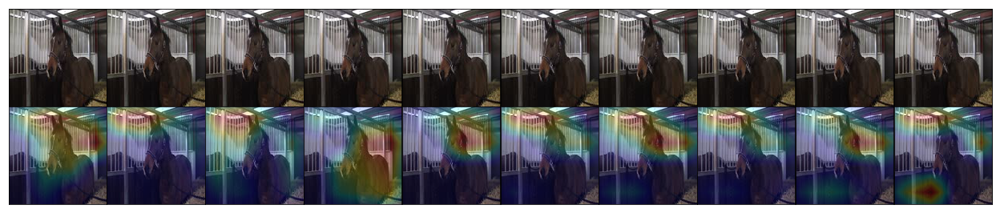

In [24]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  8865
                                                    Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001488.jpg     1
1  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001489.jpg     1
2  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001490.jpg     1
3  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001491.jpg     1
4  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001492.jpg     1
5  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001493.jpg     1
6  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001494.jpg     1
7  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001495.jpg     1
8  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001496.jpg     1
9  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001497.jpg     1
[[[1.1588986e-03 9.9877077e-01]
  [8.8694674e-04 9.9938190e-01]
  [9.4162230e-04 9.9877769e-01]
  [7.3871779e-04 9.9901175e-01]
  [4.6386849e-04 9.9950147e-01]
  [1.9436507e-04 9.9972612e-01]
  [2.5433843e-04 9.9971241e-01]
  [2.0238322e-04 9.9976295

/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


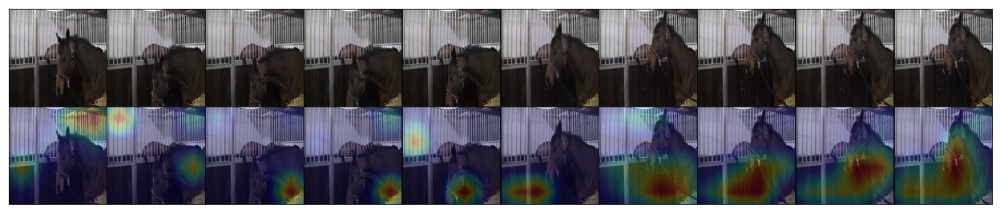

In [25]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  6258
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_2a/frame_002503.jpg     0
1  data/jpg_128_128_2fps/horse_2/2_2a/frame_002504.jpg     0
2  data/jpg_128_128_2fps/horse_2/2_2a/frame_002505.jpg     0
3  data/jpg_128_128_2fps/horse_2/2_2a/frame_002506.jpg     0
4  data/jpg_128_128_2fps/horse_2/2_2a/frame_002507.jpg     0
5  data/jpg_128_128_2fps/horse_2/2_2a/frame_002508.jpg     0
6  data/jpg_128_128_2fps/horse_2/2_2a/frame_002509.jpg     0
7  data/jpg_128_128_2fps/horse_2/2_2a/frame_002510.jpg     0
8  data/jpg_128_128_2fps/horse_2/2_2a/frame_002511.jpg     0
9  data/jpg_128_128_2fps/horse_2/2_2a/frame_002512.jpg     0
[[[0.9932376  0.01386511]
  [0.9981192  0.00501702]
  [0.99846077 0.00474632]
  [0.9984554  0.00424147]
  [0.99854326 0.00388796]
  [0.99859875 0.00361506]
  [0.99867934 0.00340974]
  [0.9985933  0.00313953]
  [0.99781835 0.00323693]
  [0.99780005 0.00459927]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


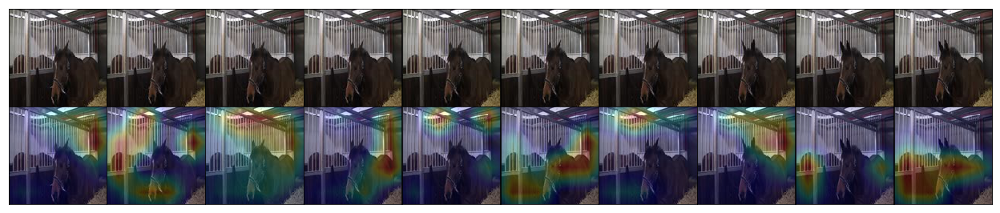

In [26]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  6899
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_2b/frame_000480.jpg     0
1  data/jpg_128_128_2fps/horse_2/2_2b/frame_000481.jpg     0
2  data/jpg_128_128_2fps/horse_2/2_2b/frame_000482.jpg     0
3  data/jpg_128_128_2fps/horse_2/2_2b/frame_000483.jpg     0
4  data/jpg_128_128_2fps/horse_2/2_2b/frame_000484.jpg     0
5  data/jpg_128_128_2fps/horse_2/2_2b/frame_000485.jpg     0
6  data/jpg_128_128_2fps/horse_2/2_2b/frame_000486.jpg     0
7  data/jpg_128_128_2fps/horse_2/2_2b/frame_000487.jpg     0
8  data/jpg_128_128_2fps/horse_2/2_2b/frame_000488.jpg     0
9  data/jpg_128_128_2fps/horse_2/2_2b/frame_000489.jpg     0
[[[0.9914266  0.00582044]
  [0.9966355  0.0020426 ]
  [0.99740416 0.00180418]
  [0.9977335  0.00200938]
  [0.9978866  0.00209173]
  [0.9978963  0.00103182]
  [0.99808323 0.00104341]
  [0.99908185 0.00100728]
  [0.99842477 0.00209978]
  [0.99770975 0.00165017]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


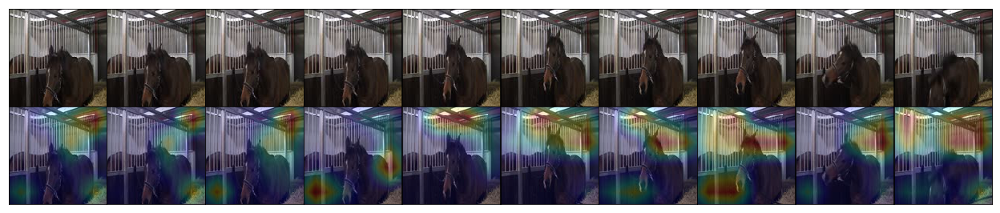

In [27]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  738
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_1a/frame_000739.jpg     0
1  data/jpg_128_128_2fps/horse_2/2_1a/frame_000740.jpg     0
2  data/jpg_128_128_2fps/horse_2/2_1a/frame_000741.jpg     0
3  data/jpg_128_128_2fps/horse_2/2_1a/frame_000742.jpg     0
4  data/jpg_128_128_2fps/horse_2/2_1a/frame_000743.jpg     0
5  data/jpg_128_128_2fps/horse_2/2_1a/frame_000744.jpg     0
6  data/jpg_128_128_2fps/horse_2/2_1a/frame_000745.jpg     0
7  data/jpg_128_128_2fps/horse_2/2_1a/frame_000746.jpg     0
8  data/jpg_128_128_2fps/horse_2/2_1a/frame_000747.jpg     0
9  data/jpg_128_128_2fps/horse_2/2_1a/frame_000748.jpg     0
[[[0.9432031  0.07937682]
  [0.95336586 0.04174159]
  [0.95561266 0.02985455]
  [0.95867693 0.03094293]
  [0.95747685 0.03167732]
  [0.94538784 0.03307728]
  [0.94259596 0.03303827]
  [0.95745325 0.03630251]
  [0.9516469  0.03717037]
  [0.9527197  0.04658113]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


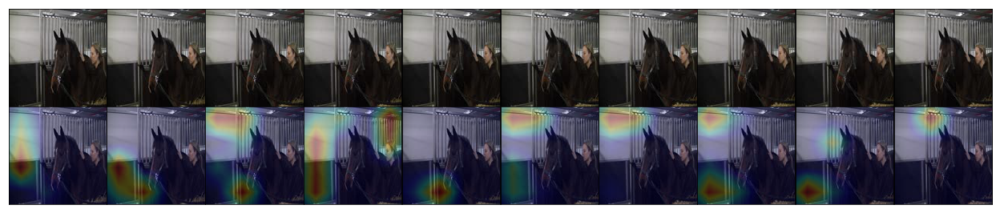

In [28]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  5058
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_2a/frame_001303.jpg     0
1  data/jpg_128_128_2fps/horse_2/2_2a/frame_001304.jpg     0
2  data/jpg_128_128_2fps/horse_2/2_2a/frame_001305.jpg     0
3  data/jpg_128_128_2fps/horse_2/2_2a/frame_001306.jpg     0
4  data/jpg_128_128_2fps/horse_2/2_2a/frame_001307.jpg     0
5  data/jpg_128_128_2fps/horse_2/2_2a/frame_001308.jpg     0
6  data/jpg_128_128_2fps/horse_2/2_2a/frame_001309.jpg     0
7  data/jpg_128_128_2fps/horse_2/2_2a/frame_001310.jpg     0
8  data/jpg_128_128_2fps/horse_2/2_2a/frame_001311.jpg     0
9  data/jpg_128_128_2fps/horse_2/2_2a/frame_001312.jpg     0
[[[0.9915617  0.0180811 ]
  [0.99809116 0.00301074]
  [0.9984407  0.00149873]
  [0.99842143 0.00179203]
  [0.99816364 0.00174317]
  [0.99871194 0.00240448]
  [0.998192   0.00279022]
  [0.9975829  0.00252298]
  [0.9980883  0.00284777]
  [0.99824643 0.00146832]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


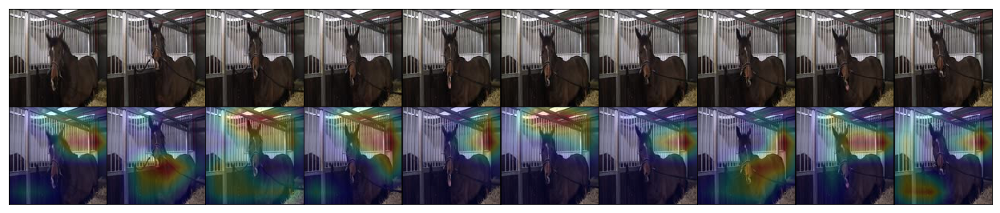

In [29]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  7692
                                                    Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000315.jpg     1
1  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000316.jpg     1
2  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000317.jpg     1
3  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000318.jpg     1
4  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000319.jpg     1
5  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000320.jpg     1
6  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000321.jpg     1
7  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000322.jpg     1
8  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000323.jpg     1
9  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000324.jpg     1
[[[1.7743000e-03 9.9851722e-01]
  [2.5023686e-04 9.9983418e-01]
  [5.6936225e-04 9.9967825e-01]
  [5.8183650e-04 9.9956554e-01]
  [4.0746844e-04 9.9889022e-01]
  [5.3606584e-04 9.9877518e-01]
  [8.5937663e-04 9.9904281e-01]
  [9.8957308e-04 9.9933714

/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


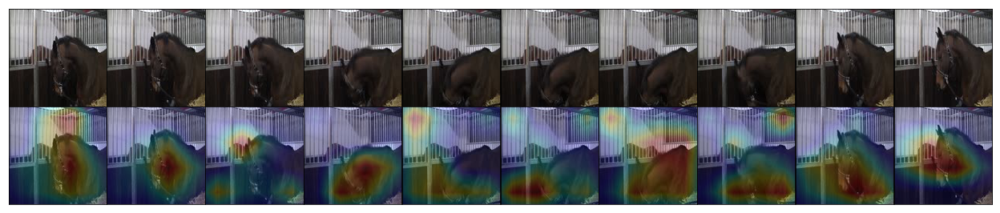

In [30]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  3207
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_1b/frame_000542.jpg     0
1  data/jpg_128_128_2fps/horse_2/2_1b/frame_000543.jpg     0
2  data/jpg_128_128_2fps/horse_2/2_1b/frame_000544.jpg     0
3  data/jpg_128_128_2fps/horse_2/2_1b/frame_000545.jpg     0
4  data/jpg_128_128_2fps/horse_2/2_1b/frame_000546.jpg     0
5  data/jpg_128_128_2fps/horse_2/2_1b/frame_000547.jpg     0
6  data/jpg_128_128_2fps/horse_2/2_1b/frame_000548.jpg     0
7  data/jpg_128_128_2fps/horse_2/2_1b/frame_000549.jpg     0
8  data/jpg_128_128_2fps/horse_2/2_1b/frame_000550.jpg     0
9  data/jpg_128_128_2fps/horse_2/2_1b/frame_000551.jpg     0
[[[0.92305505 0.18479554]
  [0.9536948  0.10983384]
  [0.9398239  0.09064327]
  [0.9488131  0.09013674]
  [0.9559163  0.07285421]
  [0.95890224 0.11191259]
  [0.9617928  0.1012514 ]
  [0.97496086 0.06529339]
  [0.9616055  0.05674732]
  [0.97326994 0.05800522]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


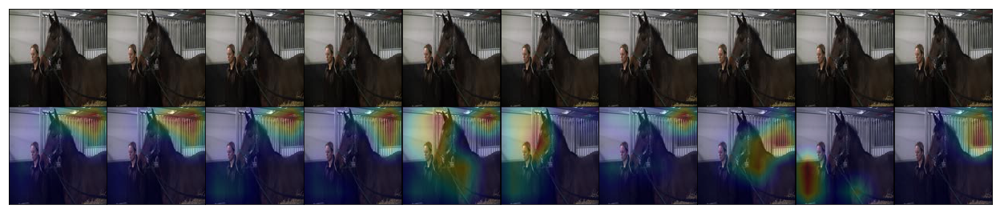

In [31]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  2494
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_1a/frame_002495.jpg     0
1  data/jpg_128_128_2fps/horse_2/2_1a/frame_002496.jpg     0
2  data/jpg_128_128_2fps/horse_2/2_1a/frame_002497.jpg     0
3  data/jpg_128_128_2fps/horse_2/2_1a/frame_002498.jpg     0
4  data/jpg_128_128_2fps/horse_2/2_1a/frame_002499.jpg     0
5  data/jpg_128_128_2fps/horse_2/2_1a/frame_002500.jpg     0
6  data/jpg_128_128_2fps/horse_2/2_1a/frame_002501.jpg     0
7  data/jpg_128_128_2fps/horse_2/2_1a/frame_002502.jpg     0
8  data/jpg_128_128_2fps/horse_2/2_1a/frame_002503.jpg     0
9  data/jpg_128_128_2fps/horse_2/2_1a/frame_002504.jpg     0
[[[0.8415507  0.15634261]
  [0.87119323 0.15178743]
  [0.8672153  0.12983428]
  [0.8568013  0.11253433]
  [0.8877418  0.10849824]
  [0.8389995  0.1286914 ]
  [0.90277696 0.09733741]
  [0.9040671  0.08525872]
  [0.9218556  0.06746344]
  [0.9129808  0.06931057]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


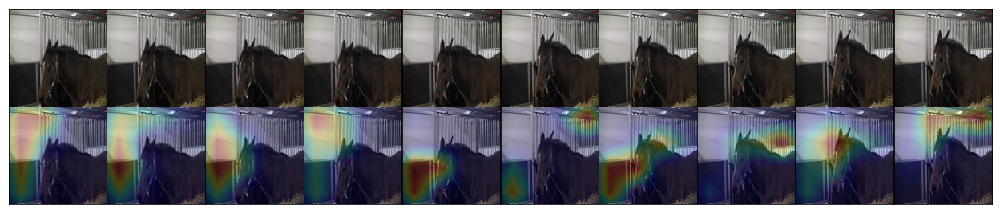

In [32]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  1784
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_1a/frame_001785.jpg     0
1  data/jpg_128_128_2fps/horse_2/2_1a/frame_001786.jpg     0
2  data/jpg_128_128_2fps/horse_2/2_1a/frame_001787.jpg     0
3  data/jpg_128_128_2fps/horse_2/2_1a/frame_001788.jpg     0
4  data/jpg_128_128_2fps/horse_2/2_1a/frame_001789.jpg     0
5  data/jpg_128_128_2fps/horse_2/2_1a/frame_001790.jpg     0
6  data/jpg_128_128_2fps/horse_2/2_1a/frame_001791.jpg     0
7  data/jpg_128_128_2fps/horse_2/2_1a/frame_001792.jpg     0
8  data/jpg_128_128_2fps/horse_2/2_1a/frame_001793.jpg     0
9  data/jpg_128_128_2fps/horse_2/2_1a/frame_001794.jpg     0
[[[0.8755769  0.07311986]
  [0.92479545 0.06326696]
  [0.9080181  0.07670741]
  [0.89892066 0.07155543]
  [0.9041061  0.0829311 ]
  [0.8721033  0.1044388 ]
  [0.87332    0.08135263]
  [0.8832991  0.07808539]
  [0.88184065 0.08641361]
  [0.88174826 0.08323453]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


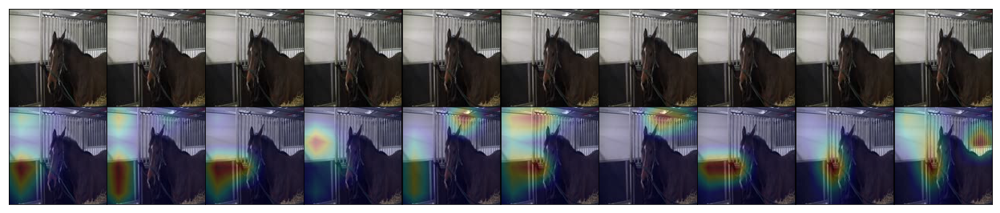

In [33]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  7724
                                                    Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000347.jpg     1
1  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000348.jpg     1
2  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000349.jpg     1
3  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000350.jpg     1
4  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000351.jpg     1
5  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000352.jpg     1
6  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000353.jpg     1
7  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000354.jpg     1
8  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000355.jpg     1
9  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_000356.jpg     1
[[[1.9205733e-03 9.9892789e-01]
  [4.3353144e-04 9.9969041e-01]
  [2.1528496e-04 9.9988568e-01]
  [2.0930514e-04 9.9985039e-01]
  [2.6084069e-04 9.9980038e-01]
  [3.7820643e-04 9.9955720e-01]
  [2.8203620e-04 9.9967253e-01]
  [3.1199859e-04 9.9982339

/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


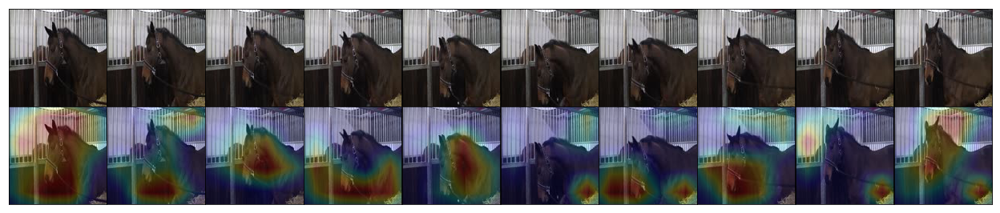

In [34]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  4726
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_2a/frame_000971.jpg     0
1  data/jpg_128_128_2fps/horse_2/2_2a/frame_000972.jpg     0
2  data/jpg_128_128_2fps/horse_2/2_2a/frame_000973.jpg     0
3  data/jpg_128_128_2fps/horse_2/2_2a/frame_000974.jpg     0
4  data/jpg_128_128_2fps/horse_2/2_2a/frame_000975.jpg     0
5  data/jpg_128_128_2fps/horse_2/2_2a/frame_000976.jpg     0
6  data/jpg_128_128_2fps/horse_2/2_2a/frame_000977.jpg     0
7  data/jpg_128_128_2fps/horse_2/2_2a/frame_000978.jpg     0
8  data/jpg_128_128_2fps/horse_2/2_2a/frame_000979.jpg     0
9  data/jpg_128_128_2fps/horse_2/2_2a/frame_000980.jpg     0
[[[0.99399465 0.00992654]
  [0.99807715 0.00326467]
  [0.998725   0.00228042]
  [0.99897766 0.00171459]
  [0.9988135  0.00177257]
  [0.9989477  0.00147902]
  [0.998926   0.00144086]
  [0.9992182  0.00142715]
  [0.9988637  0.00129987]
  [0.99882966 0.00148744]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


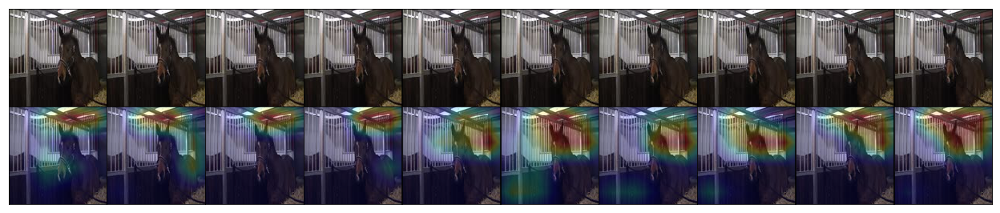

In [35]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  8392
                                                    Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001015.jpg     1
1  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001016.jpg     1
2  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001017.jpg     1
3  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001018.jpg     1
4  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001019.jpg     1
5  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001020.jpg     1
6  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001021.jpg     1
7  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001022.jpg     1
8  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001023.jpg     1
9  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001024.jpg     1
[[[8.6437346e-04 9.9795663e-01]
  [6.3341361e-04 9.9917573e-01]
  [7.8579772e-04 9.9954408e-01]
  [6.7141664e-04 9.9938118e-01]
  [3.7545271e-04 9.9959058e-01]
  [6.1205158e-04 9.9942929e-01]
  [1.0185223e-03 9.9947637e-01]
  [1.0573398e-03 9.9913710

/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


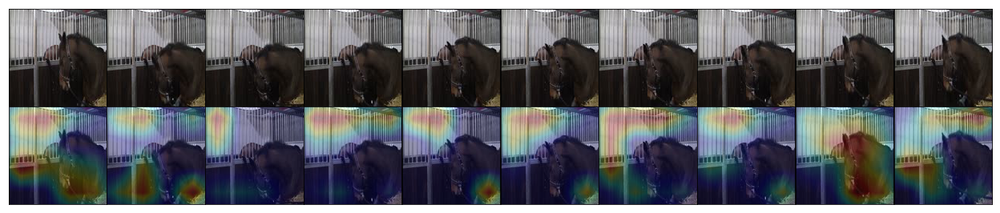

In [36]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  11323
                                                 Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_4/frame_000646.jpg     1
1  data/jpg_128_128_2fps/horse_2/2_4/frame_000647.jpg     1
2  data/jpg_128_128_2fps/horse_2/2_4/frame_000648.jpg     1
3  data/jpg_128_128_2fps/horse_2/2_4/frame_000649.jpg     1
4  data/jpg_128_128_2fps/horse_2/2_4/frame_000650.jpg     1
5  data/jpg_128_128_2fps/horse_2/2_4/frame_000651.jpg     1
6  data/jpg_128_128_2fps/horse_2/2_4/frame_000652.jpg     1
7  data/jpg_128_128_2fps/horse_2/2_4/frame_000653.jpg     1
8  data/jpg_128_128_2fps/horse_2/2_4/frame_000654.jpg     1
9  data/jpg_128_128_2fps/horse_2/2_4/frame_000655.jpg     1
[[[0.09158292 0.9353657 ]
  [0.0630265  0.97531885]
  [0.0540992  0.97677314]
  [0.08052155 0.98254746]
  [0.06678628 0.9897445 ]
  [0.05280764 0.9846758 ]
  [0.04305242 0.9794667 ]
  [0.01532524 0.9927879 ]
  [0.02308421 0.99175173]
  [0.03455315 0.98293406]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


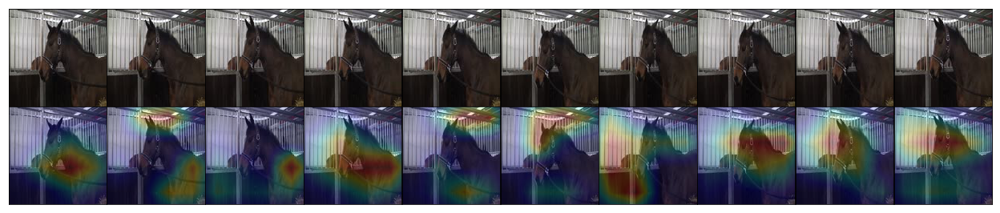

In [37]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  8554
                                                    Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001177.jpg     1
1  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001178.jpg     1
2  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001179.jpg     1
3  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001180.jpg     1
4  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001181.jpg     1
5  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001182.jpg     1
6  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001183.jpg     1
7  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001184.jpg     1
8  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001185.jpg     1
9  data/jpg_128_128_2fps/horse_2/2_3a_1/frame_001186.jpg     1
[[[1.4985601e-03 9.9846125e-01]
  [5.3197698e-04 9.9952090e-01]
  [5.3388643e-04 9.9977249e-01]
  [4.1265547e-04 9.9983728e-01]
  [4.2803580e-04 9.9985647e-01]
  [4.4847783e-04 9.9980861e-01]
  [4.0804234e-04 9.9984944e-01]
  [4.6133556e-04 9.9987304

/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


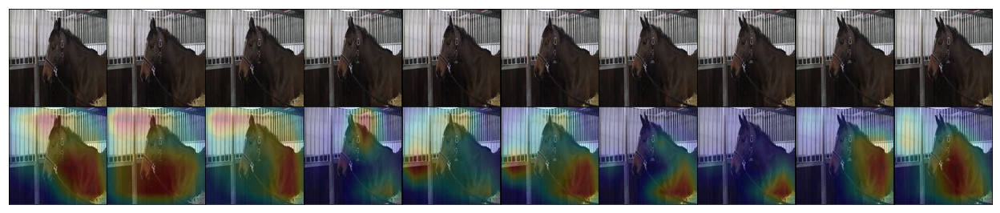

In [38]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  6203
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_2a/frame_002448.jpg     0
1  data/jpg_128_128_2fps/horse_2/2_2a/frame_002449.jpg     0
2  data/jpg_128_128_2fps/horse_2/2_2a/frame_002450.jpg     0
3  data/jpg_128_128_2fps/horse_2/2_2a/frame_002451.jpg     0
4  data/jpg_128_128_2fps/horse_2/2_2a/frame_002452.jpg     0
5  data/jpg_128_128_2fps/horse_2/2_2a/frame_002453.jpg     0
6  data/jpg_128_128_2fps/horse_2/2_2a/frame_002454.jpg     0
7  data/jpg_128_128_2fps/horse_2/2_2a/frame_002455.jpg     0
8  data/jpg_128_128_2fps/horse_2/2_2a/frame_002456.jpg     0
9  data/jpg_128_128_2fps/horse_2/2_2a/frame_002457.jpg     0
[[[0.9899406  0.03279687]
  [0.99594826 0.01156367]
  [0.99590474 0.01094119]
  [0.99700576 0.00405158]
  [0.9984668  0.0041376 ]
  [0.99841475 0.00240606]
  [0.99873203 0.00211528]
  [0.99870145 0.00290199]
  [0.9983948  0.00220083]
  [0.9987361  0.00336597]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


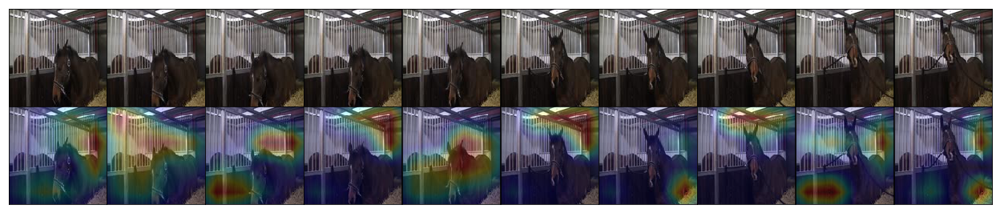

In [39]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  5975
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_2a/frame_002220.jpg     0
1  data/jpg_128_128_2fps/horse_2/2_2a/frame_002221.jpg     0
2  data/jpg_128_128_2fps/horse_2/2_2a/frame_002222.jpg     0
3  data/jpg_128_128_2fps/horse_2/2_2a/frame_002223.jpg     0
4  data/jpg_128_128_2fps/horse_2/2_2a/frame_002224.jpg     0
5  data/jpg_128_128_2fps/horse_2/2_2a/frame_002225.jpg     0
6  data/jpg_128_128_2fps/horse_2/2_2a/frame_002226.jpg     0
7  data/jpg_128_128_2fps/horse_2/2_2a/frame_002227.jpg     0
8  data/jpg_128_128_2fps/horse_2/2_2a/frame_002228.jpg     0
9  data/jpg_128_128_2fps/horse_2/2_2a/frame_002229.jpg     0
[[[0.99688464 0.00791232]
  [0.9989367  0.00218048]
  [0.999233   0.00170219]
  [0.99901545 0.00195533]
  [0.9990042  0.00259541]
  [0.9988945  0.00177123]
  [0.9990963  0.00194614]
  [0.99923754 0.00181536]
  [0.9990709  0.0027021 ]
  [0.99909294 0.00323112]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


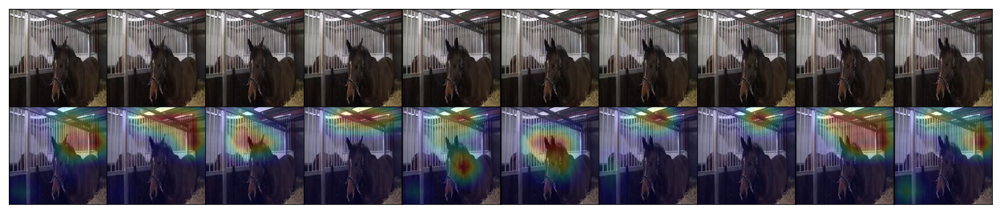

In [40]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  1391
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_1a/frame_001392.jpg     0
1  data/jpg_128_128_2fps/horse_2/2_1a/frame_001393.jpg     0
2  data/jpg_128_128_2fps/horse_2/2_1a/frame_001394.jpg     0
3  data/jpg_128_128_2fps/horse_2/2_1a/frame_001395.jpg     0
4  data/jpg_128_128_2fps/horse_2/2_1a/frame_001396.jpg     0
5  data/jpg_128_128_2fps/horse_2/2_1a/frame_001397.jpg     0
6  data/jpg_128_128_2fps/horse_2/2_1a/frame_001398.jpg     0
7  data/jpg_128_128_2fps/horse_2/2_1a/frame_001399.jpg     0
8  data/jpg_128_128_2fps/horse_2/2_1a/frame_001400.jpg     0
9  data/jpg_128_128_2fps/horse_2/2_1a/frame_001401.jpg     0
[[[0.93697345 0.08993731]
  [0.95689076 0.05027286]
  [0.9544468  0.05019135]
  [0.9569432  0.05440354]
  [0.95658785 0.05385926]
  [0.9545051  0.05607312]
  [0.95262015 0.04843359]
  [0.9500663  0.05098918]
  [0.9458812  0.04683655]
  [0.9457173  0.04832219]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


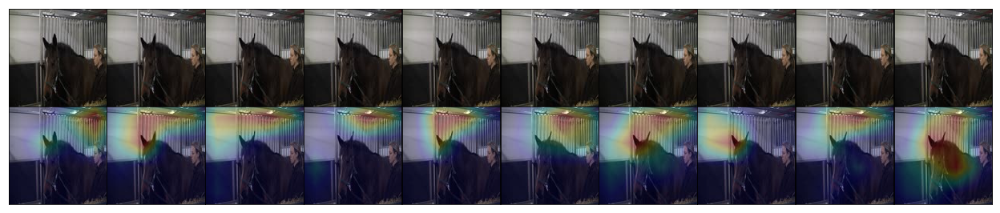

In [41]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  1773
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_1a/frame_001774.jpg     0
1  data/jpg_128_128_2fps/horse_2/2_1a/frame_001775.jpg     0
2  data/jpg_128_128_2fps/horse_2/2_1a/frame_001776.jpg     0
3  data/jpg_128_128_2fps/horse_2/2_1a/frame_001777.jpg     0
4  data/jpg_128_128_2fps/horse_2/2_1a/frame_001778.jpg     0
5  data/jpg_128_128_2fps/horse_2/2_1a/frame_001779.jpg     0
6  data/jpg_128_128_2fps/horse_2/2_1a/frame_001780.jpg     0
7  data/jpg_128_128_2fps/horse_2/2_1a/frame_001781.jpg     0
8  data/jpg_128_128_2fps/horse_2/2_1a/frame_001782.jpg     0
9  data/jpg_128_128_2fps/horse_2/2_1a/frame_001783.jpg     0
[[[0.8580955  0.10272539]
  [0.73771054 0.18494767]
  [0.8059212  0.17652236]
  [0.83023584 0.16906102]
  [0.8783985  0.10650091]
  [0.8835892  0.11569784]
  [0.8779977  0.10370155]
  [0.8820248  0.09031216]
  [0.90175575 0.09519053]
  [0.8991801  0.09617496]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


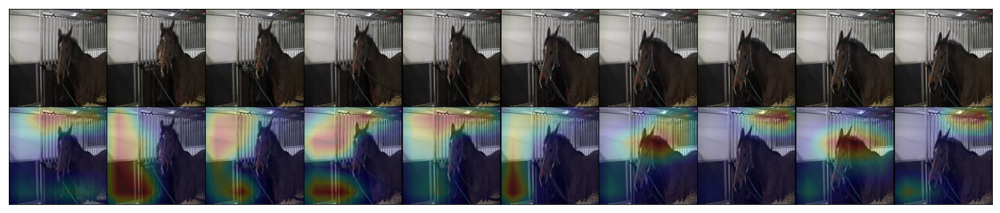

In [42]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  3233
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_1b/frame_000568.jpg     0
1  data/jpg_128_128_2fps/horse_2/2_1b/frame_000569.jpg     0
2  data/jpg_128_128_2fps/horse_2/2_1b/frame_000570.jpg     0
3  data/jpg_128_128_2fps/horse_2/2_1b/frame_000571.jpg     0
4  data/jpg_128_128_2fps/horse_2/2_1b/frame_000572.jpg     0
5  data/jpg_128_128_2fps/horse_2/2_1b/frame_000573.jpg     0
6  data/jpg_128_128_2fps/horse_2/2_1b/frame_000574.jpg     0
7  data/jpg_128_128_2fps/horse_2/2_1b/frame_000575.jpg     0
8  data/jpg_128_128_2fps/horse_2/2_1b/frame_000576.jpg     0
9  data/jpg_128_128_2fps/horse_2/2_1b/frame_000577.jpg     0
[[[0.97210735 0.03116528]
  [0.9860931  0.01449356]
  [0.98698944 0.01182026]
  [0.98714846 0.01340736]
  [0.9862975  0.01087313]
  [0.98821205 0.01784444]
  [0.9880937  0.01806501]
  [0.9903335  0.01529605]
  [0.9884526  0.01759746]
  [0.9875958  0.01773981]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


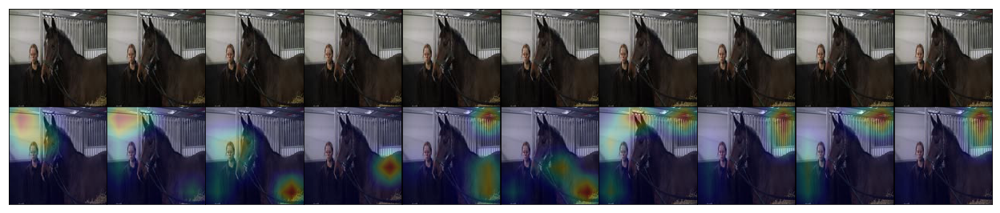

In [43]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  311
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_2/2_1a/frame_000312.jpg     0
1  data/jpg_128_128_2fps/horse_2/2_1a/frame_000313.jpg     0
2  data/jpg_128_128_2fps/horse_2/2_1a/frame_000314.jpg     0
3  data/jpg_128_128_2fps/horse_2/2_1a/frame_000315.jpg     0
4  data/jpg_128_128_2fps/horse_2/2_1a/frame_000316.jpg     0
5  data/jpg_128_128_2fps/horse_2/2_1a/frame_000317.jpg     0
6  data/jpg_128_128_2fps/horse_2/2_1a/frame_000318.jpg     0
7  data/jpg_128_128_2fps/horse_2/2_1a/frame_000319.jpg     0
8  data/jpg_128_128_2fps/horse_2/2_1a/frame_000320.jpg     0
9  data/jpg_128_128_2fps/horse_2/2_1a/frame_000321.jpg     0
[[[0.45539963 0.7087151 ]
  [0.66743106 0.49030513]
  [0.8660244  0.22029157]
  [0.9228213  0.14086765]
  [0.94473255 0.11731909]
  [0.9610092  0.12202021]
  [0.98559165 0.06661692]
  [0.9819103  0.06069574]
  [0.9831912  0.06369281]
  [0.9856614  0.07376564]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


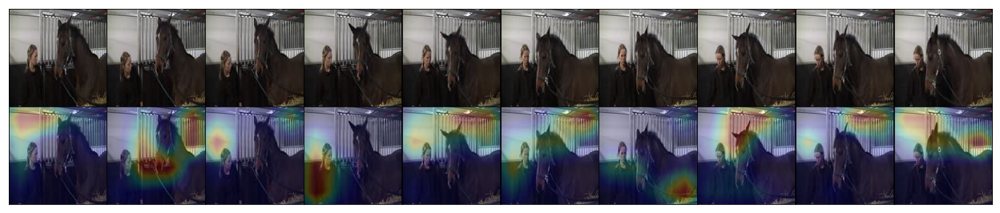

In [44]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1)
run_on_one_sequence(sess, model, batch_img)

In [ ]:
batch_img, batch_label = utils.data_for_one_random_sequence_5D(args, subject_dfs, computer='local',subject=1, start_index=9038)
run_on_one_sequence(sess, model, batch_img)